In [90]:
import pandas as pd
import numpy as np
import sys
import multiprocessing
import time
import os
import matplotlib.pyplot as plt
import seaborn as sns
from dateutil.parser import parse
from pandas.tseries.offsets import BDay
import pickle as pkl
import fnmatch

# extra imports
from collections import OrderedDict
from itertools import zip_longest
import datetime as dt
from datetime import timedelta

import glob
import fathon
from fathon import fathonUtils as fu


import matplotlib as mpl
from multiprocessing import Pool, freeze_support, Manager

import itertools
colormap = plt.cm.RdBu
plt.style.use(os.path.join(mpl.get_configdir(),'latexstyle.mplstyle'))
from collections import defaultdict
# import freqopttest.kernel as kernel
import json

In [91]:
base_folder = '/media/ak/Data1/ExperimentData/August11th2022Experiments/ExperimentInputFiles'
symbol = 'G_1'
symbol_path = os.path.join(base_folder, symbol)
bar = 'calendar'
symbol_bar_files = [f for f in os.listdir(symbol_path) if str(bar) in f]


In [92]:
symbolIdx = 1
symbol_idx_bar_path = os.path.join(symbol_path, symbol_bar_files[symbolIdx])

In [93]:

def lag_shift_dataframe(data: pd.DataFrame, lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply a lag shift to a DataFrame, keeping only specified columns, and returning both the original and lagged values.

    Args:
        data (pd.DataFrame): The input dataframe.
        lag (int): The number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original and lagged values of the specified columns.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Shift the remaining columns by the specified lag
    shifted_data = reduced_data.shift(lag)

    # Concatenate the original and shifted data
    combined_data = pd.concat([reduced_data, shifted_data], axis=1)

    # Update column names to indicate original and lagged values
    combined_data.columns = [f"{col}_orig" if i < len(columns_to_keep) else f"{col}_lag_{lag}" for i, col in enumerate(combined_data.columns)]

    return combined_data


In [5]:

import pandas as pd

def lag_shift_multiple(data: pd.DataFrame, max_lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply multiple lag shifts to a DataFrame, keeping only specified columns, and returning both the original and lagged values.

    Args:
        data (pd.DataFrame): The input dataframe.
        max_lag (int): The maximum number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original and lagged values of the specified columns for all lags up to max_lag.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Create a list to store dataframes with different lag values
    lag_dataframes = [reduced_data]

    # Apply lags from 1 to max_lag and append the lagged dataframes to the list
    for lag in range(1, max_lag + 1):
        shifted_data = reduced_data.shift(lag)
        shifted_data.columns = [f"{col}_lag{lag}" for col in shifted_data.columns]
        lag_dataframes.append(shifted_data)

    combined_data = pd.concat(lag_dataframes, axis=1)
    return combined_data

In [94]:
def create_heatmap(df):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.

    Returns:
        None.
    """
    # Create the heatmap
    plt.figure(figsize=(10, 8)) # Set the size of the figure
    sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f')

    # Add a title
    plt.title("Correlation Heatmap")

    # Show the plot
    plt.show()

In [95]:
df = pd.read_pickle(symbol_idx_bar_path)
df.columns.values

array(['micro_price', 'price_imbalance', 'pct_change_micro_price',
       'weighted_activity_spread', 'GK_vol', 'arrival_rates',
       'returns_normalised', 'returns_mix_max', 'skew', 'kurt',
       'median_traded_volume', 'jumps_test', 'relz_var', 'trip_quart'],
      dtype=object)

In [8]:
list_of_columns =['price_imbalance', 'pct_change_micro_price']

In [9]:
lag_shift_dataframe(df, 2, list_of_columns)

,price_imbalance_orig,pct_change_micro_price_orig,price_imbalance_lag_2,pct_change_micro_price_lag_2
0,-4.795727,0.000000,NaN,NaN
1,-36.397837,-0.000234,NaN,NaN
2,-34.060656,0.000150,-4.795727,0.000000
3,0.002303,-0.000198,-36.397837,-0.000234
4,35.219724,-0.000155,-34.060656,0.000150
...,...,...,...,...
358,36.167381,-0.000013,-13.295921,0.000191
359,23.416230,0.000048,13.652723,0.000096
360,53.131380,0.000077,36.167381,-0.000013
361,-12.273799,0.000117,23.416230,0.000048


In [10]:
# compute the median dataframe
median_df = pd.concat(list_of_dataframes).median(axis=1)

NameError: name 'list_of_dataframes' is not defined

In [11]:
lag_shift_multiple(df, 2, list_of_columns).columns.values

array(['price_imbalance', 'pct_change_micro_price',
       'price_imbalance_lag1', 'pct_change_micro_price_lag1',
       'price_imbalance_lag2', 'pct_change_micro_price_lag2'],
      dtype=object)

In [12]:
import pandas as pd

# compute the median dataframe across each column
median_df = pd.concat(list_of_dataframes).median().to_frame().transpose()

print(median_df)


NameError: name 'list_of_dataframes' is not defined

In [13]:
median_df = pd.concat(list_of_dataframes).groupby(level=0).median()

NameError: name 'list_of_dataframes' is not defined

In [ ]:
median_df

In [16]:

def lag_shift_multiple_efficient(data: pd.DataFrame, max_lag: int, columns_to_keep: list) -> pd.DataFrame:
    """
    Apply multiple lag shifts to a DataFrame, keeping only specified columns, and returning both the original and lagged values.

    Args:
        data (pd.DataFrame): The input dataframe.
        max_lag (int): The maximum number of periods to shift the data.
        columns_to_keep (list): A list of columns to keep and apply the shift to.

    Returns:
        combined_data (pd.DataFrame): The DataFrame containing the original and lagged values of the specified columns for all lags up to max_lag.
    """

    # Keep only the specified columns
    reduced_data = data[columns_to_keep]

    # Apply lags from 1 to max_lag and join the lagged dataframes to the original data
    for lag in range(1, max_lag + 1):
        shifted_data = reduced_data.shift(lag).add_suffix(f"_lag{lag}")
        reduced_data = reduced_data.join(shifted_data)

    return reduced_data

In [17]:
import time
tic = time.perf_counter()
lag_shift_multiple(df, 2, list_of_columns)
toc = time.perf_counter()
print("elapsed time:", (toc - tic))

elapsed time: 0.001279246062040329


In [18]:
tic = time.perf_counter()
lag_shift_multiple_efficient(df, 2, list_of_columns)
toc = time.perf_counter()
print("elapsed time:", (toc - tic))

elapsed time: 0.0023792049614712596


In [19]:
def main_multiple(idx, lag, list_of_columns):
    symbolIdx = 1
    symbol_idx_bar_path = os.path.join(symbol_path, symbol_bar_files[symbolIdx])
    df = pd.read_pickle(symbol_idx_bar_path)
    return lag_shift_multiple_efficient(df, 3, list_of_columns)

In [20]:
list_of_dataframes =  [main_multiple(f, 3, list_of_columns) for f in range(0,20)]

In [21]:
median_df = pd.concat(list_of_dataframes).groupby(level=0).median()

In [22]:
median_df

,price_imbalance,pct_change_micro_price,price_imbalance_lag1,pct_change_micro_price_lag1,price_imbalance_lag2,pct_change_micro_price_lag2,price_imbalance_lag1_lag2,pct_change_micro_price_lag1_lag2,price_imbalance_lag3,pct_change_micro_price_lag3,price_imbalance_lag1_lag3,pct_change_micro_price_lag1_lag3,price_imbalance_lag2_lag3,pct_change_micro_price_lag2_lag3,price_imbalance_lag1_lag2_lag3,pct_change_micro_price_lag1_lag2_lag3
0,-4.795727,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-36.397837,-0.000234,-4.795727,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,-34.060656,0.000150,-36.397837,-0.000234,-4.795727,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.002303,-0.000198,-34.060656,0.000150,-36.397837,-0.000234,-4.795727,0.000000,-4.795727,0.000000,NaN,NaN,NaN,NaN,NaN,NaN
4,35.219724,-0.000155,0.002303,-0.000198,-34.060656,0.000150,-36.397837,-0.000234,-36.397837,-0.000234,-4.795727,0.000000,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
358,36.167381,-0.000013,13.652723,0.000096,-13.295921,0.000191,7.563028,0.000038,7.563028,0.000038,33.302481,0.000084,12.069125,-0.000083,10.665842,-0.000002
359,23.416230,0.000048,36.167381,-0.000013,13.652723,0.000096,-13.295921,0.000191,-13.295921,0.000191,7.563028,0.000038,33.302481,0.000084,12.069125,-0.000083
360,53.131380,0.000077,23.416230,0.000048,36.167381,-0.000013,13.652723,0.000096,13.652723,0.000096,-13.295921,0.000191,7.563028,0.000038,33.302481,0.000084
361,-12.273799,0.000117,53.131380,0.000077,23.416230,0.000048,36.167381,-0.000013,36.167381,-0.000013,13.652723,0.000096,-13.295921,0.000191,7.563028,0.000038


In [23]:
import seaborn as sns

import matplotlib.pyplot as plt

def create_heatmap(df, tick_fontsize):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = 'Verdana'#'Helvetica'
    plt.rcParams['axes.edgecolor']='#333F4B'
    plt.rcParams['axes.linewidth']=0.8
    plt.rcParams['xtick.color']='#333F4B'
    plt.rcParams['ytick.color']='#333F4B'

    # Create the heatmap
    plt.figure(figsize=(10, 8)) # Set the size of the figure
    ax = sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f', cbar=False)

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Show the plot
    plt.show()



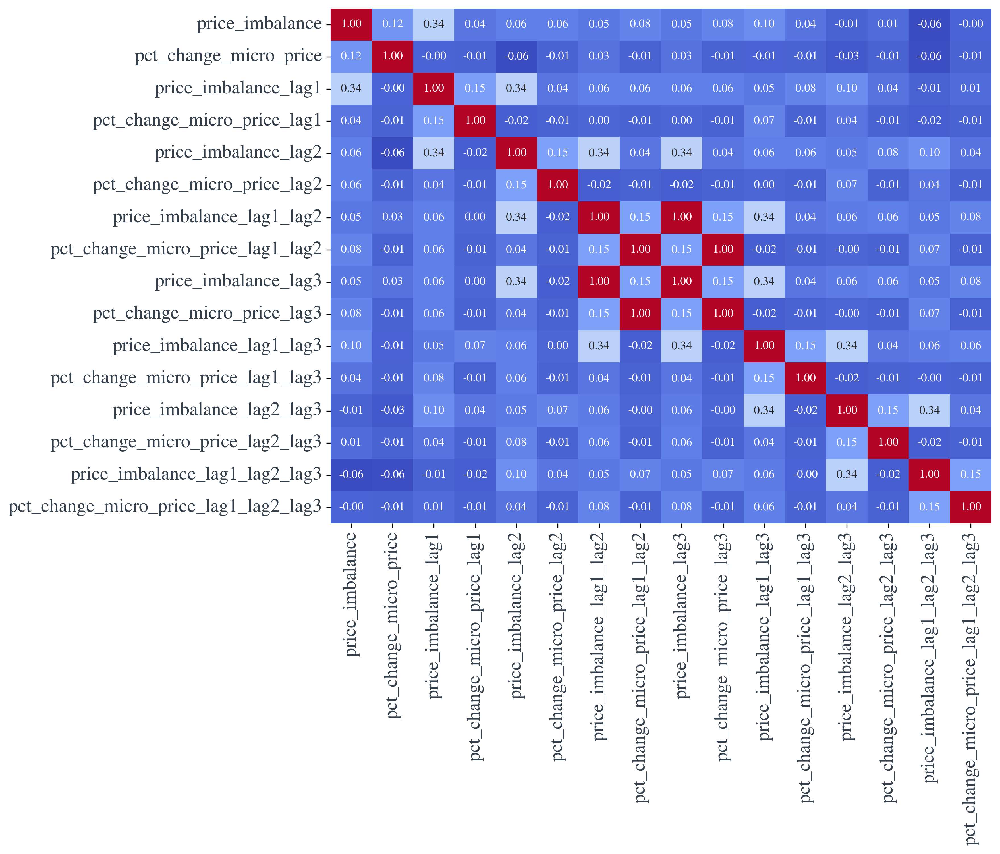

In [24]:
create_heatmap(median_df, 16)

In [25]:


def create_heatmap(df, tick_fontsize, save_plot=False, title=None, font_family='Verdana', font_size=12):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.
        save_plot (bool): Whether to save the plot as a PNG file (default is False).
        title (str): The title of the heatmap (default is None).
        font_family (str): The font family of the values in the heatmap (default is 'Verdana').
        font_size (int): The font size of the values in the heatmap (default is 12).

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = font_family
    plt.rcParams['axes.edgecolor']='#333F4B'
    plt.rcParams['axes.linewidth']=0.8
    plt.rcParams['xtick.color']='#333F4B'
    plt.rcParams['ytick.color']='#333F4B'

    # Create the heatmap
    plt.figure(figsize=(10, 8)) # Set the size of the figure
    ax = sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f', cbar=False, annot_kws={'fontsize':font_size, 'fontfamily':font_family})

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Set the title of the heatmap
    if title:
        ax.set_title(title, fontsize=14)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig(f'{title}.png', dpi=300)

    # Show the plot
    plt.show()
(figsize=(8, 6), dpi=300) # Set the size and DPI of the figure
    sns.heatmap(df.corr()*100, cmap='coolwarm', annot=True, fmt='.0f%%', ax=ax)

    # Set the title of the heatmap
    if title:
        ax.set_title(title, fontsize=14)

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig('heatmap.png', dpi=300)

    # Show the plot
    plt.show()


SyntaxError: invalid syntax (382595211.py, line 42)

In [26]:
create_heatmap_with_save(median_df, 16)

NameError: name 'create_heatmap_with_save' is not defined

In [27]:
import seaborn as sns
import matplotlib.pyplot as plt

def create_heatmap(df, tick_fontsize, save_plot=False, title=None):
    """
    Takes a Pandas DataFrame as input and creates a tight heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.
        save_plot (bool): Whether to save the plot as a PNG file (default is False).
        title (str): The title of the heatmap (default is None).

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = 'Verdana'#'Helvetica'
    plt.rcParams['axes.edgecolor']='#333F4B'
    plt.rcParams['axes.linewidth']=0.8
    plt.rcParams['xtick.color']='#333F4B'
    plt.rcParams['ytick.color']='#333F4B'

    # Create the heatmap
    fig, ax = plt.subplots(figsize=(8, 6), dpi=300) # Set the size and DPI of the figure
    sns.heatmap(df.corr()*100, cmap='coolwarm', annot=True, ax=ax, cbar=False)

    # Set the title of the heatmap
    if title:
        ax.set_title(title, fontsize=14)

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig('heatmap.png', dpi=300)

    # Show the plot
    plt.show()


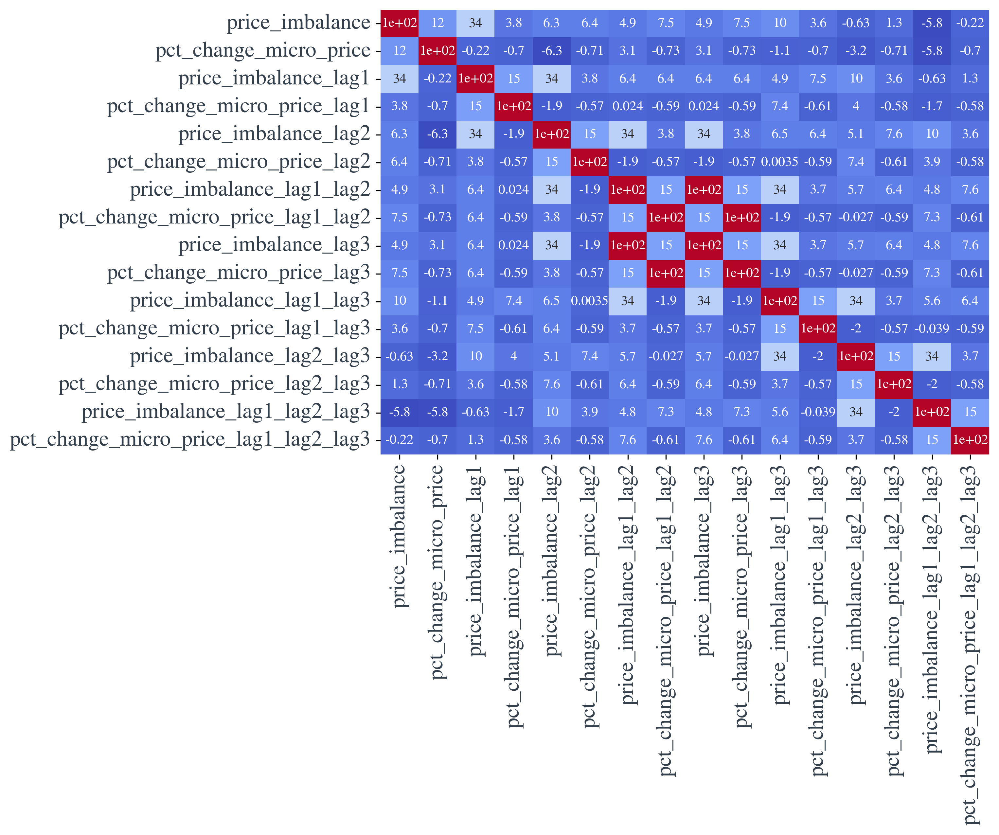

In [28]:
create_heatmap(median_df, 16)

In [29]:

def create_heatmap(df, tick_fontsize, save_plot=False, title=None, font_family='Verdana', font_size=12):
    """
    Takes a Pandas DataFrame as input and creates a heatmap using Seaborn.

    Args:
        df (pd.DataFrame): The input dataframe.
        tick_fontsize (int): The font size of the x and y tick labels.
        save_plot (bool): Whether to save the plot as a PNG file (default is False).
        title (str): The title of the heatmap (default is None).
        font_family (str): The font family of the values in the heatmap (default is 'Verdana').
        font_size (int): The font size of the values in the heatmap (default is 12).

    Returns:
        None.
    """
    # Set the font and color parameters
    plt.rcParams['font.sans-serif'] = font_family
    plt.rcParams['axes.edgecolor']='#333F4B'
    plt.rcParams['axes.linewidth']=0.8
    plt.rcParams['xtick.color']='#333F4B'
    plt.rcParams['ytick.color']='#333F4B'

    # Create the heatmap
    plt.figure(figsize=(40, 32)) # Set the size of the figure
    ax = sns.heatmap(df.corr(), cmap='coolwarm', annot=True, fmt='.2f', cbar=False, annot_kws={'fontsize':font_size, 'fontfamily':font_family})

    # Set the font size of the x and y tick labels
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Set the title of the heatmap
    if title:
        ax.set_title(title, fontsize=14)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig(f'{title}.png', dpi=300)

    # Show the plot
    plt.show()


In [30]:
create_heatmap(median_df, 56, font_size= 47)

findfont: Font family ['Verdana'] not found. Falling back to DejaVu Sans.


In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

def create_dendrogram(data, method='ward', metric='euclidean', title=None, figsize=(10, 8), save_plot=False):
    """
    Creates a dendrogram using hierarchical clustering of the input data.

    Args:
        data (pd.DataFrame): The input data.
        method (str): The clustering method to use (default is 'ward').
        metric (str): The distance metric to use (default is 'euclidean').
        title (str): The title of the dendrogram (default is None).
        figsize (tuple): The size of the figure (default is (10, 8)).
        save_plot (bool): Whether to save the plot as a PNG file (default is False).

    Returns:
        None.
    """
    # Check for missing or infinite values in the data
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        # Replace missing or infinite values with the mean of the non-missing values
        data = data.replace([np.inf, -np.inf], np.nan).fillna(data.mean())

    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=method, metric=metric)

    # Create the dendrogram
    fig, ax = plt.subplots(figsize=figsize)
    dendrogram(linkage_matrix, ax=ax, labels=data.index)
    ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=14)

    # Set the title of the dendrogram
    if title:
        ax.set_title(title, fontsize=14)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig(f'{title}.png', dpi=300)

    # Show the plot
    plt.show()


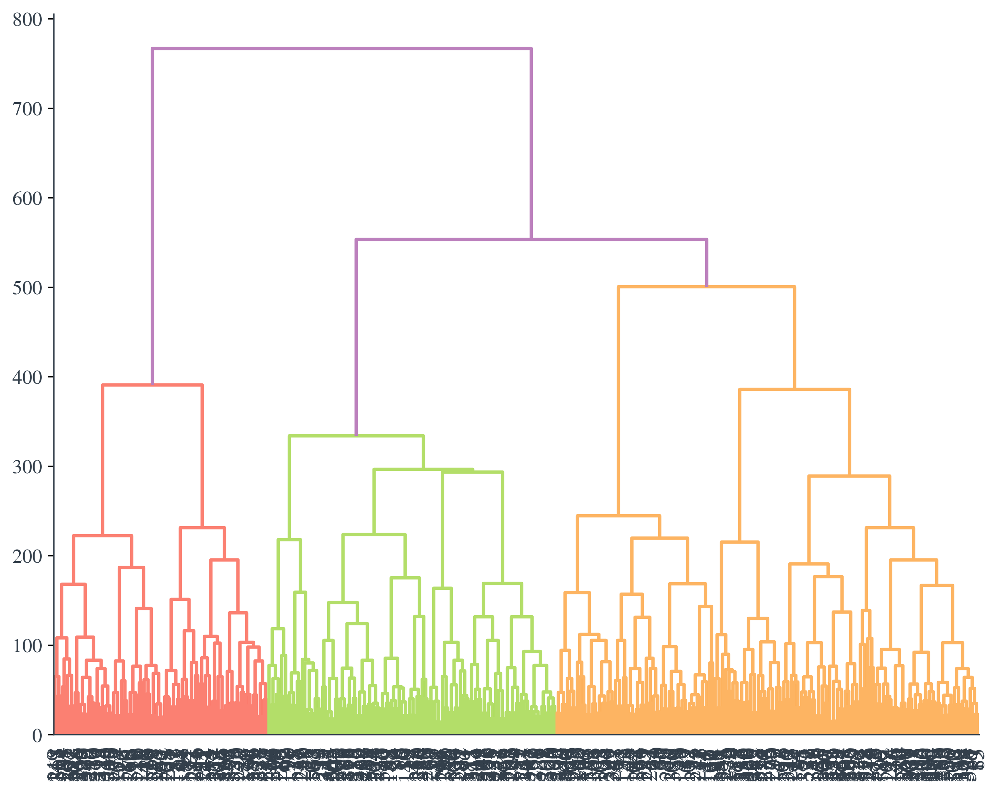

In [37]:
create_dendrogram(median_df)

In [60]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, dendrogram

def create_dendrogram(data, method='ward', metric='euclidean', title=None, figsize=(20, 16), save_plot=False):
    """
    Creates a dendrogram using hierarchical clustering of the input data.

    Args:
        data (pd.DataFrame): The input data.
        method (str): The clustering method to use (default is 'ward').
        metric (str): The distance metric to use (default is 'euclidean').
        title (str): The title of the dendrogram (default is None).
        figsize (tuple): The size of the figure (default is (10, 8)).
        save_plot (bool): Whether to save the plot as a PNG file (default is False).

    Returns:
        None.
    """
    # Check for missing or infinite values in the data
    if np.any(np.isnan(data)) or np.any(np.isinf(data)):
        # Replace missing or infinite values with the mean of the non-missing values
        data = data.replace([np.inf, -np.inf], np.nan).fillna(data.mean())

    # Compute the linkage matrix
    linkage_matrix = linkage(data, method=method, metric=metric)

    # Create the dendrogram
    fig, ax = plt.subplots(figsize=figsize)
    dendrogram(linkage_matrix, ax=ax, labels=data.index, orientation='right')

    # Set the title of the dendrogram
    if title:
        ax.set_title(title, fontsize=14)

    # Rotate the y-axis tick labels
    plt.xticks(rotation=45, fontsize =25)
     # Set the font size of the y-axis tick labels
    plt.yticks(fontsize=25, rotation =45)

    # Save the plot as a high-quality PNG image
    if save_plot:
        plt.tight_layout()
        plt.savefig(f'{title}.png', dpi=300)

    # Show the plot
    plt.show()


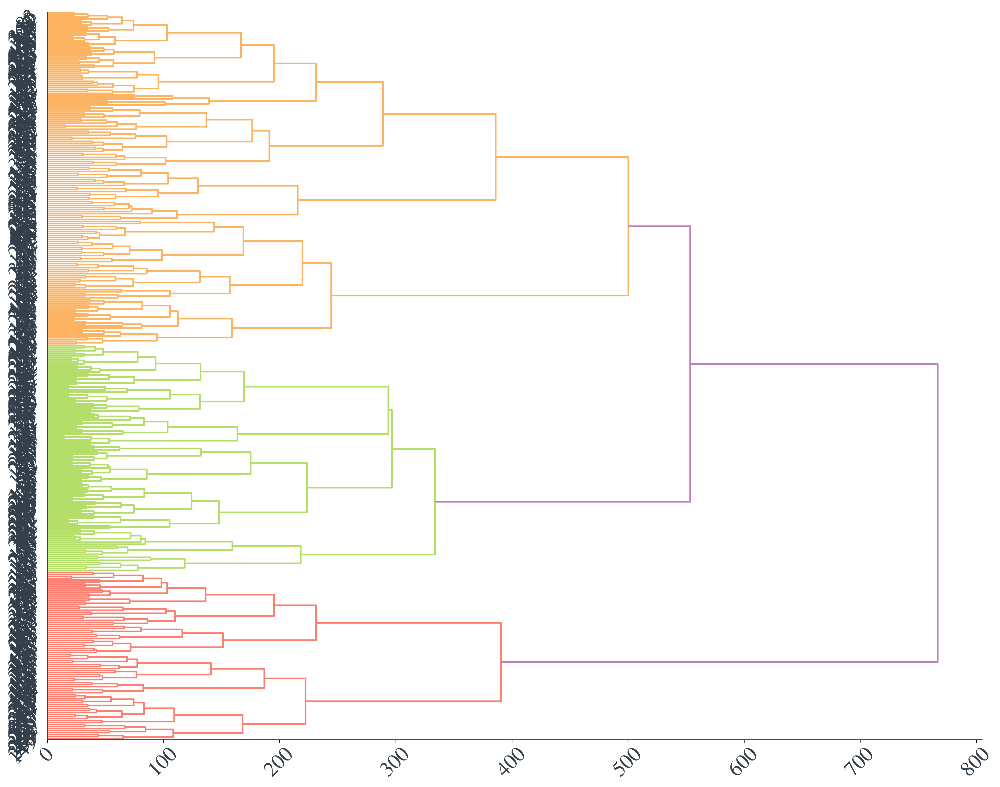

In [61]:
create_dendrogram(median_df)

In [64]:
import seaborn as sns

def plot_boxplot(df):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    
    Returns:
    None
    """
    sns.set_theme(style="whitegrid") # Set the Seaborn style to "whitegrid"
    
    for column in df.columns:
        fig, ax = plt.subplots(figsize=(10, 1)) # Create a new figure and axis for each column
        sns.boxplot(x=df[column], orient="h", ax=ax, color='lightblue') # Plot a horizontal boxplot for the column
        ax.set_xlabel(column, fontsize=12) # Set the x-axis label to the column name
        sns.despine(left=True) # Remove the left spine
        plt.show() # Show the plot


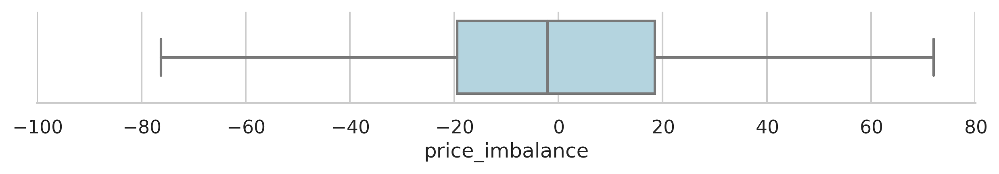

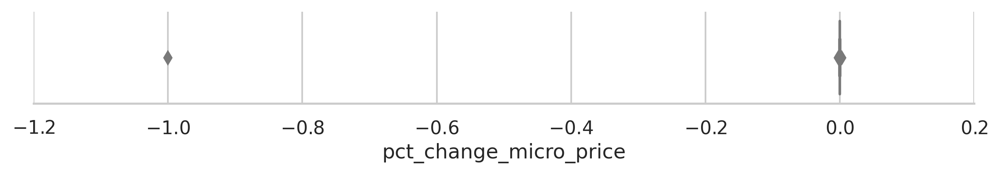

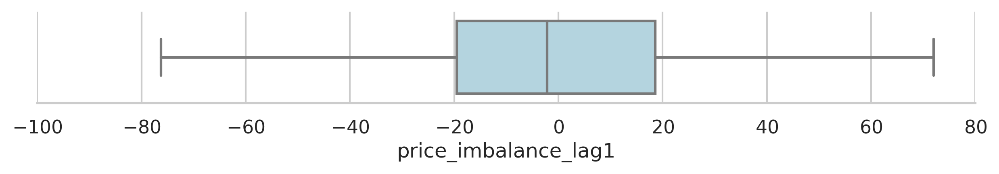

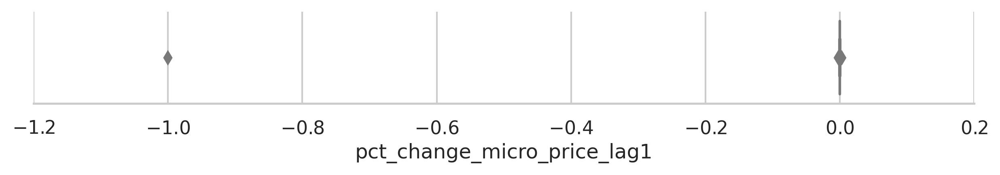

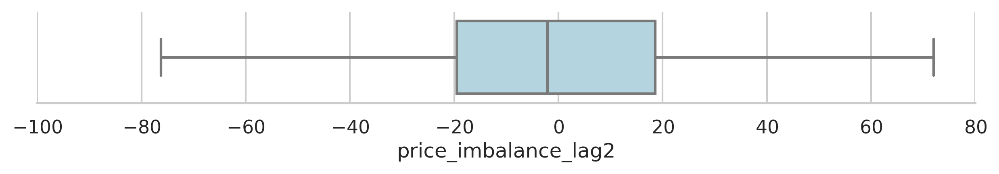

...

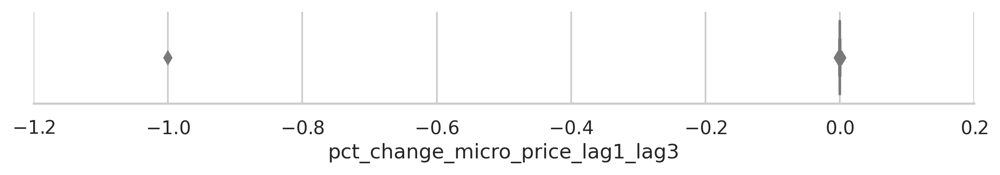

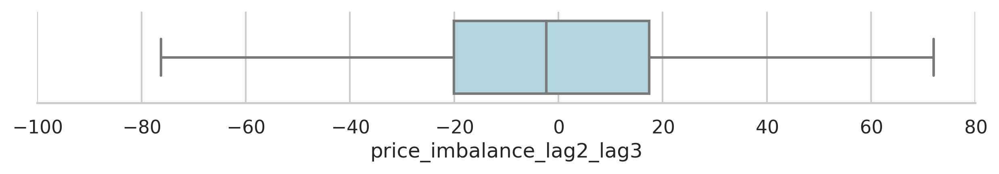

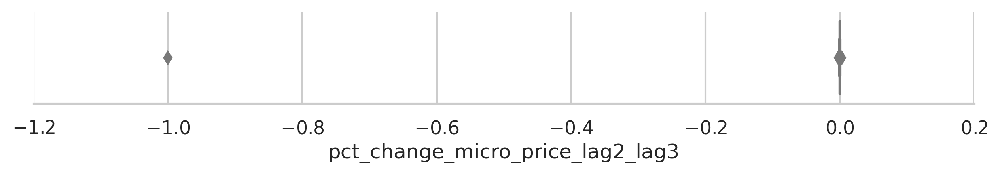

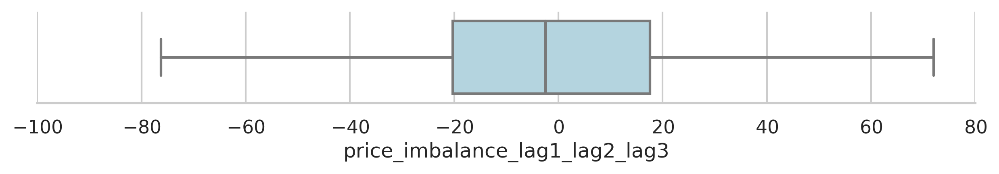

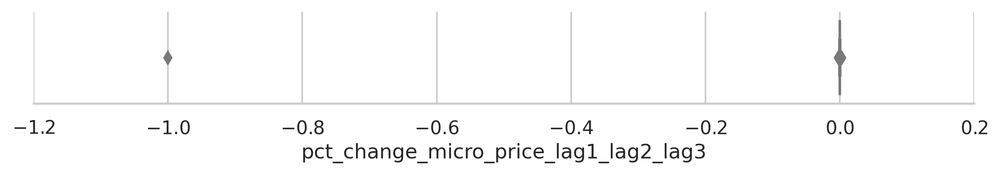

In [65]:
plot_boxplot(median_df)

In [66]:
import seaborn as sns

def plot_boxplot_all(df):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    
    Returns:
    None
    """
    sns.set_theme(style="whitegrid") # Set the Seaborn style to "whitegrid"
    fig, ax = plt.subplots(figsize=(10, len(df.columns))) # Create a new figure and axis for the plot
    
    sns.boxplot(data=df, orient="h", ax=ax, color='lightblue') # Plot a horizontal boxplot for each column
    ax.set_xlabel("Value", fontsize=12) # Set the x-axis label to "Value"
    ax.set_ylabel("Variable", fontsize=12) # Set the y-axis label to "Variable"
    sns.despine() # Remove the top and right spines
    plt.show() # Show the plot


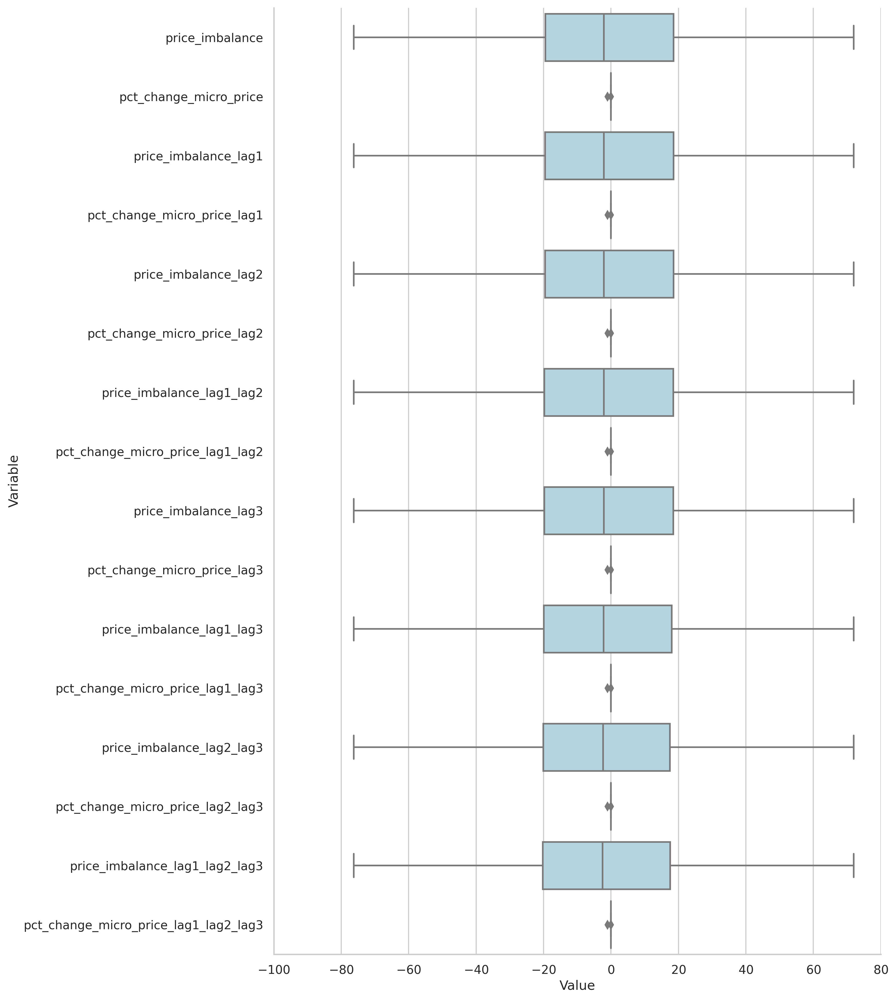

In [67]:
plot_boxplot_all(median_df)

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt


def plot_horizontal_boxplot_all(df, title="", savefig=False):
    """
    Function to plot a horizontal boxplot for each column of the dataframe
    
    Arguments:
    df -- a pandas dataframe
    title -- a string representing the title of the plot (default is an empty string)
    savefig -- a boolean indicating whether to save the plot (default is False)
    
    Returns:
    None
    """
    sns.set_theme(style="ticks") # Set the Seaborn style to "ticks"
    color_palette = sns.color_palette("vlag", n_colors=len(df.columns), desat=.5) # Define a color palette with one color for each column
    
    fig, ax = plt.subplots(figsize=(10, len(df.columns))) # Create a new figure and axis for the plot
    sns.boxplot(data=df, orient="h", palette=color_palette) # Plot all horizontal boxplots in one plot with a different color for each column
    ax.set_ylabel("") # Set the y-axis label to an empty string
    sns.despine() # Remove the top and right spines
    
    if title != "": # If a title is provided
        ax.set_title(title) # Set the title of the plot
    
    if savefig: # If savefig is True
        if title == "": # If no title is provided, set the title to "horizontal_boxplot"
            title = "horizontal_boxplot"
        plt.savefig(title + ".png") # Save the plot as a PNG image
    
    plt.show() # Show the plot



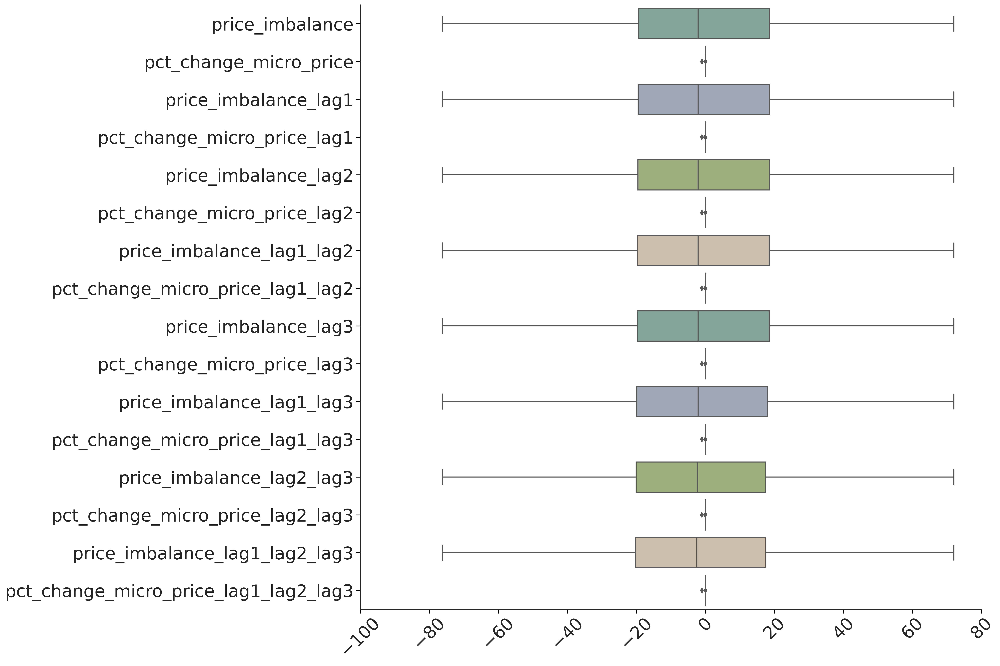

In [97]:
plot_horizontal_boxplot_all_with_save(median_df, xticksize= 25, yticksize=25)

In [88]:
import seaborn as sns
import matplotlib.pyplot as plt


